# Setup

In [33]:
import math
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from datetime import datetime
from datetime import date
from datetime import time
from datetime import timedelta

# Load Data

In [34]:
data = np.genfromtxt("simcounts.csv",delimiter=",")
print(data.shape)
normmax = max(data[0])

phases = []
for yr in range(2000,2022):
    phasedata = np.genfromtxt("phases/phases" + str(yr) + ".csv",delimiter=",",skip_header=1,missing_values="--")[:,1:].flatten(order='F')
    phasedata = phasedata[~np.isnan(phasedata)]
    phases.append(phasedata)

phases = np.expand_dims(np.concatenate(phases),0)
print(phases.shape)

data = np.concatenate((data,phases))
print(data.shape)


# data = np.load('simulation_data_pa3.npz')
# print(data['temp'].shape)
# print(data['u1'].shape)
# print(data['co2'].shape)
# print(data['d'].shape)
# print(np.max(data['co2']) - np.min(data['co2']))


# plot(data)


(2, 8036)
(1, 8036)
(3, 8036)


In [35]:
use_cuda = torch.cuda.is_available()
if use_cuda:
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
FloatTensor = torch.cuda.FloatTensor if use_cuda else torch.FloatTensor
LongTensor = torch.cuda.LongTensor if use_cuda else torch.LongTensor
ByteTensor = torch.cuda.ByteTensor if use_cuda else torch.ByteTensor
BoolTensor = torch.cuda.BoolTensor if use_cuda else torch.BoolTensor
Tensor = FloatTensor

def createSamples(data, lookBack, normalize=False):
    dataX = []
    dataY = []
    if normalize:
        # divide variable of its range
        data[0] /= np.max(data[0])
        data[1] /= np.max(data[1])
    T = data.shape[1]
    for t in range(T-lookBack):
        # x = np.stack([temp[:,t:t+lookBack], co2[:,t:t+lookBack], people[:,t:t+lookBack], u1[:,t:t+lookBack], u2[:,t:t+lookBack], amb[:,t:t+lookBack]], axis=-1)
        # y = np.concatenate([temp[:,t+lookBack:t+lookBack+1], co2[:,t+lookBack:t+lookBack+1]], axis=1)
        # x = np.stack(moon[t:t+lookBack], nightc[t:t+lookBack], fullc[t:t+lookBack], axis=-1)
        x = np.expand_dims(np.transpose(data[:,t:t+lookBack]),0)
        # print(x.shape)
        y = data[0,t+lookBack:t+lookBack+1]
        dataX.append(x)
        dataY.append(y)
        # print(y*normmax)
    X = np.concatenate(dataX, axis=0)
    Y = np.array(dataY)
    return Tensor(X), Tensor(Y)

# def createSamples(data, lookBack, normalize=False):
#     dataX = []
#     dataY = []
#     temp, co2, people, u1, u2, amb = data['temp'], data['co2'], data['d'], data['u1'], data['u2'], data['amb']
#     if normalize:
#         # divide variable of its range
#         temp /= 30
#         co2 /= 2000
#         people /= 100
#         u1 /= 30
#         u2 /= 20
#         amb /= 30
#     B, T = temp.shape
#     u1 = np.repeat(u1, T, axis=1)
#     u2 = np.repeat(u2, T, axis=1)
#     # print(T)
#     for t in range(T-lookBack):
#         x = np.stack([temp[:,t:t+lookBack], co2[:,t:t+lookBack], people[:,t:t+lookBack]], axis=-1)
#         y = np.concatenate([temp[:,t+lookBack:t+lookBack+1]], axis=1)
#         dataX.append(x)
#         dataY.append(y)
#         # print(x.shape)
#         # print(y.shape)
#     X = np.concatenate(dataX, axis=0)
#     Y = np.concatenate(dataY, axis=0)
#     return Tensor(X), Tensor(Y)

In [36]:
# print(data[0])
X, y = createSamples(data, lookBack=30, normalize=True)
print(X.shape)
print(y.shape)
# print(y*normmax)

torch.Size([8006, 30, 3])
torch.Size([8006, 1])


In [37]:
import time

def train(model, dataloader, loss_func, device, grad_norm_clip):
    model.train()
    total_mse, total_count = 0, 0
    log_interval = 100
    start_time = time.time()

    for idx, (X, y) in enumerate(dataloader):
        X = X.to(device)
        y = y.to(device)
        optimizer.zero_grad()

        y_pred = model(X)
        loss = loss_func(y_pred, y)
        loss.backward()

        optimizer.step()
        total_mse += loss.item()
        total_count += X.size(0)
        if idx % log_interval == 0 and idx > 0:
            elapsed = time.time() - start_time
            print('| epoch {:3d} | {:5d}/{:5d} batches '
                  '| MSE {:8.3f}'.format(epoch, idx, len(dataloader),
                                              total_mse/total_count))
            total_mse, total_count = 0, 0
            start_time = time.time()
    return total_mse/total_count

def evaluate(model, dataloader, loss_func, device, normalize=True):
    model.eval()
    total_mse, total_count = 0, 0

    with torch.no_grad():
        for idx, (X, y) in enumerate(dataloader):
            X = X.to(device)
            y = y.to(device)

            ###########################################################################
            # TODO: compute the prediction of the input, get the loss.                #
            # If normalize the data, multiply the prediction value and true value by its range
            ###########################################################################
            y_pred = model(X)
            # TODO: fill in normalize
            if normalize:
                # y_pred[:,0] = y_pred[:,0]*110
                # y_pred[:,1] = y_pred[:,1]*1667
                y_pred[:] = y_pred[:]*normmax

                # y[:,0] = y[:,0]*110
                # y[:,1] = y[:,1]*1667
                y[:] = y[:]*normmax

                # y_pred[:,0] = y_pred[:,0]*30
                # y_pred[:,1] = y_pred[:,1]*2000

                # y[:,0] = y[:,0]*30
                # y[:,1] = y[:,1]*2000
            loss = loss_func(y_pred, y)
            # print(y[3,:])
            # print(y_pred[3,:])
            print(y)
            print(y_pred)
            ###########################################################################
            #                             END OF YOUR CODE                            #
            ###########################################################################

            total_mse += loss.item()
            total_count += X.size(0)
    return total_mse/total_count

In [38]:
def test(model, dataloader, loss_func, device, normalize=True):
    model.eval()
    total_mse, total_count = 0, 0

    with torch.no_grad():
        for idx, (X, y) in enumerate(dataloader):
            X = X.to(device)
            y = y.to(device)
            if idx == 0:
                print(X.shape)
                print(y.shape)

            ###########################################################################
            # TODO: compute the prediction of the input, get the loss.                #
            # If normalize the data, multiply the prediction value and true value by its range
            ###########################################################################
            y_pred = model(X)
            # TODO: fill in normalize
            # 30 and 2000
            if normalize:
                y_pred[:] = y_pred[:]*normmax
                y[:] = y[:]*normmax
            loss = loss_func(y_pred, y)
            check = torch.sum((y_pred - y) ** 2) / y.shape[0]
            # print(y[3,:])
            # print(y_pred[3,:])
            ###########################################################################
            #                             END OF YOUR CODE                            #
            ###########################################################################

            total_mse += loss.item()
            total_count += X.size(0)
            print(y)
            print(y_pred)
            print(loss)
            print(check)
    return total_mse/total_count

# RNN

In [39]:
# Documentation of nn.Module https://pytorch.org/docs/stable/generated/torch.nn.Module.html#torch.nn.Module
class RNNCell(torch.nn.Module):
    """
    RNNCell is a single cell that takes x_t and h_{t-1} as input and outputs h_t.
    """
    def __init__(self, input_dim: int, hidden_dim: int):
        """
        Constructor of RNNCell.

        Inputs:
        - input_dim: Dimension of the input x_t
        - hidden_dim: Dimension of the hidden state h_{t-1} and h_t
        """

        # We always need to do this step to properly implement the constructor
        super(RNNCell, self).__init__()

        self.linear_x, self.linear_h, self.non_linear = None, None, None

        ###########################################################################
        # TODO: Define the linear transformation layers for x_t and h_{t-1} and   #
        # the non-linear layer. You can use tanh here.                            #
        ###########################################################################
        self.linear_x = nn.Parameter(torch.randn([hidden_dim, input_dim]))
        self.linear_h = nn.Parameter(torch.randn([hidden_dim, hidden_dim]))
        self.non_linear = torch.tanh

        ###########################################################################
        #                             END OF YOUR CODE                            #
        ###########################################################################

    def forward(self, x_cur: torch.Tensor, h_prev: torch.Tensor):
        """
        Compute h_t given x_t and h_{t-1}.

        Inputs:
        - x_cur: x_t, a tensor with the same of BxC, where B is the batch size and
          C is the channel dimension.
        - h_prev: h_{t-1}, a tensor with the same of BxH, where H is the channel
          dimension.
        """
        h_cur = None
        ###########################################################################
        # TODO: Define the linear transformation layers for x_t and h_{t-1} and   #
        # the non-linear layer.                                                   #
        ###########################################################################
        xpart = self.linear_x @ torch.t(x_cur)
        hpart = self.linear_h @ torch.t(h_prev)
        h_cur = self.non_linear(xpart + hpart)
        h_cur = torch.t(h_cur)

        ###########################################################################
        #                             END OF YOUR CODE                            #
        ###########################################################################
        return h_cur

In [40]:
# Let's run a sanity check of your model
x = torch.randn((2, 8))
h = torch.randn((2, 16))
model = RNNCell(input_dim=8, hidden_dim = 16)
y = model(x, h)
assert len(y.shape) == 2 and y.shape == (2,16)
print(y.shape)

torch.Size([2, 16])


In [41]:
class RNN(torch.nn.Module):
    """
    RNN is a single-layer (stack) RNN by connecting multiple RNNCell together in a single
    direction, where the input sequence is processed from left to right.
    """
    def __init__(self, input_dim: int, hidden_dim: int):
        """
        Constructor of the RNN module.

        Inputs:
        - input_dim: Dimension of the input x_t
        - hidden_dim: Dimension of the hidden state h_{t-1} and h_t
        """
        super(RNN, self).__init__()

        self.hidden_dim = hidden_dim

        ###########################################################################
        # TODO: Define the RNNCell.                                               #
        ###########################################################################
        self.cell = RNNCell(input_dim, hidden_dim)

        ###########################################################################
        #                             END OF YOUR CODE                            #
        ###########################################################################

    def forward(self, x: torch.Tensor):
        """
        Compute the hidden representations for every token in the input sequence.

        Input:
        - x: A tensor with the shape of BxLxC, where B is the batch size, L is the squence
          length, and C is the channel dimmension

        Return:
        - h: A tensor with the shape of BxLxH, where H is the hidden dimension of RNNCell
        """
        b = x.shape[0]
        seq_len = x.shape[1]

        # initialize the hidden dimension
        init_h = x.new_zeros((b, self.hidden_dim))

        h = None
        ###########################################################################
        # TODO: Compute the hidden representation for every token in the input    #
        # from left to right.
        ###########################################################################
        # h = init_h.new_zeros((b, seq_len, self.hidden_dim))
        h_n = init_h
        for n in range(seq_len):
            h_n = self.cell(x[:,n,:], h_n)
            if n == 0:
                h = torch.unsqueeze(h_n,dim=1)
            else:
                h = torch.cat((h, torch.unsqueeze(h_n,dim=1)), dim=1)
        ###########################################################################
        #                             END OF YOUR CODE                            #
        ###########################################################################

        return h

In [42]:
# Let's run a sanity check of your model
x = torch.randn((2, 10, 8))
model = RNN(input_dim=8, hidden_dim=16)
y = model(x)
assert len(y.shape) == 3 and y.shape == (2,10,16)
print(y.shape)

torch.Size([2, 10, 16])


In [43]:
class RNNmodel(nn.Module):
    """
    A RNN-based predictor
    """
    def __init__(self,
            input_dim: int, rnn_hidden_dim: int, output_dim: int
        ):
        """
        Constructor.

        Inputs:
        - input_dim: input dimension of the sequence
        - rnn_hidden_dim: The hidden dimension of the RNN.
        - output_dim: output dimension
        """
        super(RNNmodel, self).__init__()
        self.rnn, self.fc = None, None

        ###########################################################################
        # TODO: Define the RNN and the predictor layer.                           #
        ###########################################################################
        self.rnn = RNN(input_dim, rnn_hidden_dim)
        self.fc = nn.Parameter(torch.randn([output_dim, rnn_hidden_dim]))

        ###########################################################################
        #                             END OF YOUR CODE                            #
        ###########################################################################

    def init_weights(self):
        initrange = 0.1
        self.fc.weight.data.uniform_(-initrange, initrange)
        self.fc.bias.data.zero_()

    def forward(self, x):
        """
        Get the prediction result of the input based on the predictor type

        Input:
        - x: Tensor with the shape of BxLxC.

        Return:
        - y: Tensor with the shape of BxO, where O is the output dimension
        """

        y = None
        ###########################################################################
        # TODO: Compute logits of the input.                                      #
        ###########################################################################
        hs = self.rnn(x)
        y = self.fc @ torch.t(hs[:,-1,:])
        y = torch.t(y)


        ###########################################################################
        #                             END OF YOUR CODE                            #
        ###########################################################################

        return y

In [44]:
# Let's run a sanity check of your model
input_dim = 4
length = 5
batch_size = 2
rnn_hidden_dim = 10
output_dim = 2

x = torch.randn(batch_size, length, input_dim)
print('x.shape: {}'.format(x.shape))
model = RNNmodel(input_dim, rnn_hidden_dim, output_dim)
y = model(x)
assert y.shape == (batch_size, output_dim)
print(y.shape)

x.shape: torch.Size([2, 5, 4])
torch.Size([2, 2])


In [45]:
from torch.utils.data import DataLoader
from torch.utils.data import random_split
from torch.utils.data import TensorDataset

# TODO: try different Hyper parameters
epochs = 240 # epoch
lr = 1e-3 # learning rate
batch_size = 64 # batch size for training
rnn_hidden_dim = 20
input_dim = 3# 6
output_dim = 1# 2

model, loss_func = None, None
###########################################################################
# TODO: Define the classifier and loss function.
###########################################################################
model = RNNmodel(input_dim, rnn_hidden_dim, output_dim)
loss_func = nn.MSELoss()

###########################################################################
#                             END OF YOUR CODE                            #
###########################################################################


model = model.to(device)
# print(list(model.parameters()))
total_mse = None
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, epochs, 1e-2)

# Change normalize bool variable to get raw data or normalized data
X, y = createSamples(data, lookBack=60, normalize=True)
dataset = TensorDataset(X, y)
train_size = int(0.8 * len(dataset))
val_size = int(0.1 * len(dataset))
test_size = len(dataset) - train_size - val_size
train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
valid_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

trainmses = []
validmses = []
for epoch in range(1, epochs + 1, 1):
    epoch_start_time = time.time()
    mse_trn = train(model, train_dataloader, loss_func, device, 1)
    trainmses.append(mse_trn)
    mse_val = evaluate(model, valid_dataloader, loss_func, device, normalize=True)
    validmses.append(mse_val)
    if total_mse is not None and total_mse > mse_val:
        scheduler.step()
    else:
        total_mse = mse_val
    if epoch == 5000:
        optimizer.param_groups[0]['lr'] = 5e-2
    print('-' * 59)
    print('| end of epoch {:3d} | time: {:5.2f}s | '
          'valid mse {:8.3f} '.format(epoch,
                                           time.time() - epoch_start_time,
                                           mse_val))
    #print('-' * 59)

rnnmodel = model

# epochx = range(1, epochs+1)
# plt.plot(epochx,trainmses,label="Training Loss")
# plt.plot(epochx,validmses,label="Validation Loss")
# plt.title("RNN Loss over Training")
# plt.xlabel("Epoch")
# plt.ylabel("Mean Squared Error")
# plt.legend()

tensor([[354.0000],
        [519.0000],
        [100.0000],
        [ 72.0000],
        [552.0000],
        [564.0000],
        [117.0000],
        [358.0000],
        [504.0000],
        [506.0000],
        [123.0000],
        [116.0000],
        [364.0000],
        [ 10.0000],
        [ 35.0000],
        [508.0000],
        [ 35.0000],
        [ 43.0000],
        [  9.0000],
        [ 28.0000],
        [599.0000],
        [ 67.0000],
        [ 76.0000],
        [ 20.0000],
        [ 42.0000],
        [ 39.0000],
        [  4.0000],
        [262.0000],
        [ 44.0000],
        [119.0000],
        [ 20.0000],
        [187.0000],
        [248.0000],
        [ 32.0000],
        [ 22.0000],
        [ 45.0000],
        [ 45.0000],
        [113.0000],
        [568.0000],
        [ 70.0000],
        [231.0000],
        [ 71.0000],
        [ 45.0000],
        [ 12.0000],
        [291.0000],
        [ 72.0000],
        [ 19.0000],
        [ 70.0000],
        [383.0000],
        [265.0000],


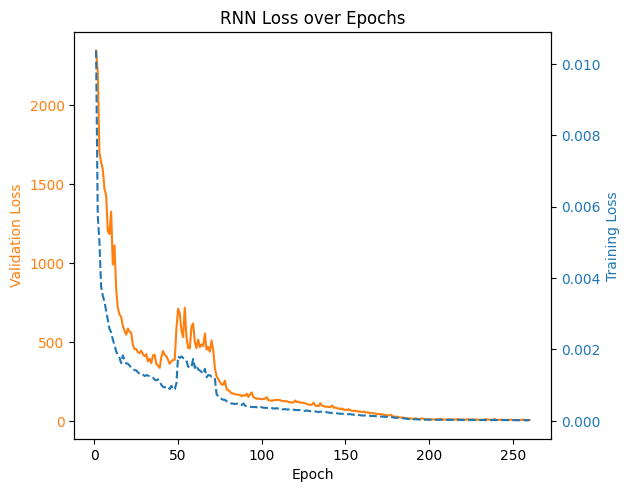

In [46]:
fig, ax1 = plt.subplots()

epochx = range(1, epochs+1)
color = 'tab:orange'
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Validation Loss', color=color)
ax1.plot(epochx, validmses, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second Axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('Training Loss', color=color)  # we already handled the x-label with ax1
ax2.plot(epochx, trainmses, color=color,linestyle='dashed')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.title("RNN Loss over Epochs")
plt.show()

In [47]:
# test(model, train_dataloader, loss_func, device, 1)

# Transformer

In [48]:
class MultiHeadAttention(nn.Module):
    """
    A module that computes multi-head attention given query, key, and value tensors.
    """
    def __init__(self, input_dim: int, num_heads: int):
        """
        Constructor.

        Inputs:
        - input_dim: Dimension of the input query, key, and value. Here we assume they all have
          the same dimensions. But they could have different dimensions in other problems.
        - num_heads: Number of attention heads
        """
        super(MultiHeadAttention, self).__init__()

        assert input_dim % num_heads == 0

        self.input_dim = input_dim
        self.num_heads = num_heads
        self.dim_per_head = input_dim // num_heads

        ###########################################################################
        # TODO: Define the linear transformation layers for key, value, and query.#
        # Also define the output layer.
        ###########################################################################
        # K, Q, V
        self.Wk = nn.Parameter(torch.randn([num_heads, input_dim, input_dim]))
        self.Wq = nn.Parameter(torch.randn([num_heads, input_dim, input_dim]))
        self.Wv = nn.Parameter(torch.randn([num_heads, input_dim, input_dim]))

        # output layer
        self.Wy = nn.Parameter(torch.randn([num_heads*input_dim, input_dim]))
        ###########################################################################
        #                             END OF YOUR CODE                            #
        ###########################################################################


    def forward(self, query: torch.Tensor, key: torch.Tensor, value: torch.Tensor, mask: torch.Tensor=None):
        """
        Compute the attended feature representations.

        Inputs:
        - query: Tensor of the shape BxLxC, where B is the batch size, L is the sequence length,
          and C is the channel dimension
        - key: Tensor of the shape BxLxC
        - value: Tensor of the shape BxLxC
        - mask: Tensor indicating where the attention should *not* be performed
        """
        b = query.shape[0]

        dot_prod_scores = None
        ###########################################################################
        # TODO: Compute the scores based on dot product between transformed query,#
        # key, and value. You may find torch.matmul helpful, whose documentation  #
        # can be found at                                                         #
        # https://pytorch.org/docs/stable/generated/torch.matmul.html#torch.matmul#
        # Remember to divide the dot product similarity scores by square root of #
        # the channel dimension per head.
        #                                                                         #
        # Since no for loops are allowed here, think of how to use tensor reshape #
        # to process multiple attention heads at the same time.                   #
        ###########################################################################
        # create K, Q, V
        # should be uhhh BxhxLxC output? BxLxC * hxCxC
        keyu = key.unsqueeze(1)
        queryu = query.unsqueeze(1)
        valueu = value.unsqueeze(1)
        K = torch.matmul(keyu,self.Wk)
        Q = torch.matmul(queryu,self.Wq)
        V = torch.matmul(valueu,self.Wv)
        # compute attention scores
        # BxhxCxL
        Kt = torch.swapaxes(K,2,3)
        d = self.input_dim  # C
        # should be uh BxhxLxL ?
        dot_prod_scores = torch.div(torch.matmul(Q,Kt), d**0.5)
        ###########################################################################
        #                             END OF YOUR CODE                            #
        ###########################################################################

        if mask is not None:
            # We simply set the similarity scores to be near zero for the positions
            # where the attention should not be done. Think of why we do this.
            dot_prod_scores = dot_prod_scores.masked_fill(mask == 0, -1e9)

        out = None
        ###########################################################################
        # TODO: Compute the attention scores, which are then used to modulate the #
        # value tensor. Finally concate the attended tensors from multiple heads  #
        # and feed it into the output layer. You may still find torch.matmul      #
        # helpful.                                                                #
        #                                                                         #
        # Again, think of how to use reshaping tensor to do the concatenation.    #
        ###########################################################################
        # still BxhxLxL
        A = torch.softmax(dot_prod_scores,3)
        # should be BxhxLxC ?
        output = torch.matmul(A,V)

        # concat should be BxLx(h*C)   to multiply by (h*C)xC
        L = query.shape[1]
        h = self.num_heads
        C = self.input_dim
        concat = torch.reshape(output,(b,L,h*C))

        # out should be same shape as input? BxLxC
        out = torch.matmul(concat,self.Wy)
        ###########################################################################
        #                             END OF YOUR CODE                            #
        ###########################################################################

        return out

In [49]:
# Let's run a sanity check of your model
x = torch.randn((2, 10, 8))
mask = torch.randn((2, 10)) > 0.5
mask = mask.unsqueeze(1).unsqueeze(-1)
num_heads = 4
model = MultiHeadAttention(8, num_heads)
y = model(x, x, x, mask)
assert len(y.shape) == len(x.shape)
for dim_x, dim_y in zip(x.shape, y.shape):
    assert dim_x == dim_y
print(y.shape)

torch.Size([2, 10, 8])


In [50]:
class FeedForwardNetwork(nn.Module):
    """
    A simple feedforward network. Essentially, it is a two-layer fully-connected
    neural network.
    """
    def __init__(self, input_dim, ff_dim):
        """
        Inputs:
        - input_dim: Input dimension
        - ff_dim: Hidden dimension
        """
        super(FeedForwardNetwork, self).__init__()

        ###########################################################################
        # TODO: Define the two linear layers and a non-linear one.
        ###########################################################################
        self.wx = nn.Parameter(torch.randn([input_dim, ff_dim]))
        self.wh = nn.Parameter(torch.randn([ff_dim, input_dim]))
        self.non_linear = torch.tanh

        ###########################################################################
        #                             END OF YOUR CODE                            #
        ###########################################################################

    def forward(self, x: torch.Tensor):
        """
        Input:
        - x: Tensor of the shape BxLxC, where B is the batch size, L is the sequence length,
         and C is the channel dimension

        Return:
        - y: Tensor of the shape BxLxC
        """

        y = None
        ###########################################################################
        # TODO: Process the input.                                                #
        ###########################################################################
        # after 1st layer, should be BxLxh
        layer1 = torch.matmul(x,self.wx)
        # after 2nd layer, should be BxLxC
        layer2 = torch.matmul(layer1,self.wh)

        y = self.non_linear(layer2)

        ###########################################################################
        #                             END OF YOUR CODE                            #
        ###########################################################################
        # typo? this was x until I changed it to y
        return y


In [51]:
# Let's run a sanity check of your model
x = torch.randn((2, 10, 8))
ff_dim = 4
model = FeedForwardNetwork(8, ff_dim)
y = model(x)
assert len(x.shape) == len(y.shape)
for dim_x, dim_y in zip(x.shape, y.shape):
    assert dim_x == dim_y
print(y.shape)

torch.Size([2, 10, 8])


In [52]:
class TransformerEncoderCell(nn.Module):
    """
    A single cell (unit) for the Transformer encoder.
    """
    def __init__(self, input_dim: int, num_heads: int, ff_dim: int, dropout: float):
        """
        Inputs:
        - input_dim: Input dimension for each token in a sequence
        - num_heads: Number of attention heads in a multi-head attention module
        - ff_dim: The hidden dimension for a feedforward network
        - dropout: Dropout ratio for the output of the multi-head attention and feedforward
          modules.
        """
        super(TransformerEncoderCell, self).__init__()

        ###########################################################################
        # TODO: A single Transformer encoder cell consists of
        # 1. A multi-head attention module
        # 2. Followed by dropout
        # 3. Followed by layer norm (check nn.LayerNorm)
        # https://pytorch.org/docs/stable/generated/torch.nn.LayerNorm.html#torch.nn.LayerNorm

        # At the same time, it also has
        # 1. A feedforward network
        # 2. Followed by dropout
        # 3. Followed by layer norm
        ###########################################################################
        self.input_dim = input_dim
        self.num_heads = num_heads
        self.ff_dim = ff_dim
        self.att = MultiHeadAttention(input_dim,num_heads)
        self.ffn = FeedForwardNetwork(input_dim,ff_dim)
        self.dropout = nn.Dropout(dropout)
        self.layernorm = nn.LayerNorm(input_dim)

        ###########################################################################
        #                             END OF YOUR CODE                            #
        ###########################################################################

    def forward(self, x: torch.Tensor, mask: torch.Tensor=None):
        """
        Inputs:
        - x: Tensor of the shape BxLxC, where B is the batch size, L is the sequence length,
          and C is the channel dimension
        - mask: Tensor for multi-head attention
        Returns:
        - y: Tensor of the shape BxLxC
        """

        y = None
        ###########################################################################
        # TODO: Get the output of the multi-head attention part (with dropout     #
        # and layer norm), which is used as input to the feedforward network (    #
        # again, followed by dropout and layer norm).                             #
        #                                                                         #
        # Don't forget the residual connections for both parts.                   #
        ###########################################################################
        attout = self.att(x,x,x,mask=mask)
        attout = self.dropout(attout)
        attout = self.layernorm(attout)

        fnnout = self.ffn(attout)
        fnnout = self.dropout(fnnout)
        fnnout = self.layernorm(fnnout)
        y = fnnout
        ###########################################################################
        #                             END OF YOUR CODE                            #
        ###########################################################################

        return y

In [53]:
# Let's run a sanity check of your model
mask = torch.randn((2, 10)) > 0.5
mask = mask.unsqueeze(1).unsqueeze(-1)
num_heads = 4
model = TransformerEncoderCell(8, num_heads, 32, 0.1)
y = model(x, mask)
assert len(x.shape) == len(y.shape)
for dim_x, dim_y in zip(x.shape, y.shape):
    assert dim_x == dim_y
print(y.shape)

torch.Size([2, 10, 8])


In [54]:
class TransformerEncoder(nn.Module):
    """
    A full encoder consisting of a set of TransformerEncoderCell.
    """
    def __init__(self, input_dim: int, num_heads: int, ff_dim: int, num_cells: int, dropout: float=0.1):
        """
        Inputs:
        - input_dim: Input dimension for each token in a sequence
        - num_heads: Number of attention heads in a multi-head attention module
        - ff_dim: The hidden dimension for a feedforward network
        - num_cells: Number of TransformerEncoderCells
        - dropout: Dropout ratio for the output of the multi-head attention and feedforward
          modules.
        """
        super(TransformerEncoder, self).__init__()

        self.norm = None
        ###########################################################################
        # TODO: Construct a nn.ModuleList to store a stack of                     #
        # TranformerEncoderCells. Check the documentation here of how to use it   #
        # https://pytorch.org/docs/stable/generated/torch.nn.ModuleList.html#torch.nn.ModuleList

        # At the same time, define a layer normalization layer to process the     #
        # output of the entire encoder.                                           #
        ###########################################################################
        self.modlist = nn.ModuleList([TransformerEncoderCell(input_dim,num_heads,ff_dim,dropout) for i in range(num_cells)])
        self.layernorm = nn.LayerNorm(input_dim) # TODO: dimensions??

        ###########################################################################
        #                             END OF YOUR CODE                            #
        ###########################################################################

    def forward(self, x: torch.Tensor, mask: torch.Tensor=None):
        """
        Inputs:
        - x: Tensor of the shape BxLxC, where B is the batch size, L is the sequence length,
          and C is the channel dimension
        - mask: Tensor for multi-head attention

        Return:
        - y: Tensor of the shape of BxLxC, which is the normalized output of the encoder
        """

        y = None
        ###########################################################################
        # TODO: Feed x into the stack of TransformerEncoderCells and then         #
        # normalize the output with layer norm.                                   #
        ###########################################################################
        for i, l in enumerate(self.modlist):
          x = l(x,mask)
        
        y = self.layernorm(x)

        ###########################################################################
        #                             END OF YOUR CODE                            #
        ###########################################################################

        return y

In [55]:
# Let's run a sanity check of your model
x = torch.randn((2, 10, 8))
mask = torch.randn((2, 10)) > 0.5
mask = mask.unsqueeze(1).unsqueeze(-1)
num_heads = 4
model = TransformerEncoder(8, num_heads, 32, 2, 0.1)
y = model(x)
assert len(x.shape) == len(y.shape)
for dim_x, dim_y in zip(x.shape, y.shape):
    assert dim_x == dim_y
print(y.shape)

torch.Size([2, 10, 8])


In [56]:
class PositionalEncoding(nn.Module):
    """
    A module that adds positional encoding to each of the token's features.
    So that the Transformer is position aware.
    """
    def __init__(self, input_dim: int, max_len: int=10000):
        """
        Inputs:
        - input_dim: Input dimension about the features for each token
        - max_len: The maximum sequence length
        """
        super(PositionalEncoding, self).__init__()

        self.input_dim = input_dim
        # TODO: added this here?
        self.max_len = max_len

    def forward(self, x):
        """
        Compute the positional encoding and add it to x.

        Input:
        - x: Tensor of the shape BxLxC, where B is the batch size, L is the sequence length,
          and C is the channel dimension

        Return:
        - x: Tensor of the shape BxLxC, with the positional encoding added to the input
        """
        seq_len = x.shape[1]
        input_dim = x.shape[2]

        pe = None
        ###########################################################################
        # TODO: Compute the positional encoding                                   #
        # Check Section 3.5 for the definition (https://arxiv.org/pdf/1706.03762.pdf)
        #                                                                         #
        # It's a bit messy, but the definition is provided for your here for your #
        # convenience (in LaTex).                                                 #
        # PE_{(pos,2i)} = sin(pos / seq_len^{2i/\dmodel}) \\                        #
        # PE_{(pos,2i+1)} = cos(pos / 10000^{2i/\dmodel})                         #
        #                                                                         #
        # You should replace 10000 with max_len here.
        ###########################################################################
        d = input_dim
        B = x.shape[0]
        pos = torch.tensor(range(0,seq_len,1))
        pos = torch.unsqueeze(torch.transpose(pos.repeat(d,1),0,1),0)
        pos = pos.repeat(B,1,1)
        ones = torch.ones((B,seq_len), dtype=torch.bool)
        zeros = torch.zeros((B,seq_len), dtype=torch.bool)
        onezero = torch.reshape(torch.stack((ones,zeros),dim=2),(B,seq_len,2))
        mask = onezero.repeat(1,1,math.ceil(d/2))
        i = [i for i in range(0,math.ceil(d/2)) for _ in range(2)]
        if d % 2 != 0:
            i.pop()
            mask = mask[:,:,:d]
        i = torch.tensor(i)
        paren = torch.div(pos, torch.pow(seq_len,2*i/d))
        pe = torch.zeros((B,seq_len,d))
        even = torch.sin(paren)
        odd = torch.cos(paren)
        pe = pe + mask*even
        pe = pe + ~mask*odd
        # I have no idea how this works

        ###########################################################################
        #                             END OF YOUR CODE                            #
        ###########################################################################

        x = x + pe.to(x.device)
        return x

In [57]:
class TransformerModel(nn.Module):
    """
    A Transformer-based predictor.
    """
    def __init__(self,
           input_dim: int, num_heads:int, trx_ff_dim: int, num_trx_cells:int, output_dim: int, dropout: float=0.1
        ):
        """
        Inputs:
        - input_dim: input_dimension of the sequence
        - num_heads: Number of attention heads in a multi-head attention module
        - trx_ff_dim: The hidden dimension for a feedforward network
        - num_trx_cells: Number of TransformerEncoderCells
        - output_dim: output dimension
        - dropout: Dropout ratio
        """
        super(TransformerModel, self).__init__()

        ###########################################################################
        # TODO: Define a module for positional encoding, Transformer encoder, and #
        # a output layer                                                          #
        ###########################################################################
        self.input_dim = input_dim
        self.posenc = PositionalEncoding(input_dim)
        self.transenc = TransformerEncoder(input_dim,num_heads,trx_ff_dim,num_trx_cells,dropout)
        # TODO: check dimensions
        self.Wo = nn.Parameter(torch.randn([input_dim, output_dim]))

        ###########################################################################
        #                             END OF YOUR CODE                            #
        ###########################################################################

    def forward(self, x, mask=None):
        """
        Inputs:
        - x: Tensor with the shape of BxLxC.
        - mask: Tensor for multi-head attention

        Return:
        - y: Tensor with the shape of BxK, where K is the output dimension
        """


        y = None
        ###########################################################################
        # TODO: Apply positional encoding to the input, which is then fed into    #
        # the encoder. Average pooling is applied then to all the features of all #
        # tokens. Finally, the prediction value are computed based on the pooled features.  #
        ###########################################################################
        L = x.shape[1]
        encx = self.posenc(x)
        transfx = self.transenc(encx,mask)
        transfx = torch.transpose(transfx,1,2)
        pool = nn.AvgPool1d(L)
        poolx = torch.squeeze(pool(transfx))
        y = torch.matmul(poolx,self.Wo)

        

        ###########################################################################
        #                             END OF YOUR CODE                            #
        ###########################################################################

        return y

In [58]:
# Let's run a sanity check of your model
batch_size, input_dim, output_dim, sequence_l = 2, 6, 3, 10
num_heads = 3
trx_ff_dim = 16
num_trx_cells = 2

x = torch.randn(batch_size, sequence_l, input_dim)
mask = None
model = TransformerModel(input_dim=input_dim, num_heads=num_heads, trx_ff_dim=trx_ff_dim, num_trx_cells=num_trx_cells, output_dim=output_dim)
print('x: {}'.format(x.shape))
y = model(x, mask)
assert len(y.shape) == 2 and y.shape[0] == x.shape[0] and y.shape[1] == output_dim
print(y.shape)

x: torch.Size([2, 10, 6])
torch.Size([2, 3])


# Train Model

In [59]:
# from torch.utils.data import DataLoader
# from torch.utils.data import random_split
# from torch.utils.data import TensorDataset

# # Hyper parameters
# epochs = 30 # epoch
# lr = 1e-4 # learning rate
# batch_size = 64 # batch size for training
# num_heads = 3
# num_trx_cells = 4
# input_dim = 3
# output_dim = 1
# trx_ff_dim = 20

# # runTransformer(epochs, lr, batch_size, num_heads, num_trx_cells, input_dim, output_dim, trx_ff_dim)
# model, loss_func = None, None
# ###########################################################################
# # TODO: Define the classifier and loss function.                          #
# ###########################################################################
# model = TransformerModel(input_dim, num_heads, trx_ff_dim, num_trx_cells, output_dim)
# loss_func = nn.MSELoss()

# ###########################################################################
# #                             END OF YOUR CODE                            #
# ###########################################################################


# model = model.to(device)
# total_mse = None
# optimizer = torch.optim.AdamW(model.parameters(), lr=lr)
# scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, epochs, 1e-2)

# X, y = createSamples(data, lookBack=60, normalize=True)
# dataset = TensorDataset(X, y)
# train_size = int(0.8 * len(dataset))
# val_size = int(0.1 * len(dataset))
# test_size = len(dataset) - train_size - val_size
# train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])
# train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
# valid_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
# test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# for epoch in range(1, epochs + 1, 1):
#     epoch_start_time = time.time()
#     train(model, train_dataloader, loss_func, device, 1)
#     mse_val = evaluate(model, valid_dataloader, loss_func, device, normalize=True)
#     if total_mse is not None and total_mse > mse_val:
#         scheduler.step()
#     else:
#         total_mse = mse_val
#     if epoch == 100:
#         optimizer.param_groups[0]['lr'] = 1e-3
#     print('-' * 59)
#     print('| end of epoch {:3d} | time: {:5.2f}s | '
#         'valid mse {:8.3f} '.format(epoch,
#                                         time.time() - epoch_start_time,
#                                         mse_val))
#     #print('-' * 59)

# tfmodel = model

In [60]:
# test(model, train_dataloader, loss_func, device, 1)

# Plot Prediction on New Test Data

In [61]:
testdata = np.genfromtxt("simcountstest.csv",delimiter=",")
normmax = max(testdata[0])
truecounts = testdata[0]

phases2022 = np.genfromtxt("phases/phases2022.csv",delimiter=",",skip_header=1,missing_values="--")[:,1:].flatten(order='F')
phases2022 = phases2022[~np.isnan(phases2022)]
phases2023 = np.genfromtxt("phases/phases2023.csv",delimiter=",",skip_header=1,missing_values="--")[:,1:].flatten(order='F')
phases2023 = phases2023[~np.isnan(phases2023)]

phases = np.expand_dims(np.concatenate((phases2022,phases2023)),0)

testdata = np.concatenate((testdata,phases))

lb = 60
X, y = createSamples(testdata, lookBack=lb, normalize=True)
print(X.shape)
print(y.shape)

totaldays = 365 + 365
dayofyear = np.arange(0,366,1)
dayofyear = np.concatenate((dayofyear[:-1],dayofyear[:-1]))
x = np.arange(0,totaldays,1)
day = []
for i in range(len(x)):
    d = x[i].item()
    day.append(date(2022,1,1) + timedelta(days=d))

torch.Size([670, 60, 3])
torch.Size([670, 1])


In [62]:
def forecast(model, Xs, ys, loss_func, device, normalize=True):
    model.eval()
    total_mse, total_count = 0, 0
    with torch.no_grad():
        Xs = Xs.to(device)
        ys = ys.to(device)

        timesteps = ys.shape[0]
        
        y_preds = []
        # for i in range(timesteps):
        #     X = Xs[i,:,:]
        #     y = ys[i,:]
        #     y_pred = model(X)
        #     if normalize:
        #         # y_pred[:,0] = y_pred[:,0]*110
        #         # y_pred[:,1] = y_pred[:,1]*1667
        #         y_pred[:] = y_pred[:]*normmax

        #         # y[:,0] = y[:,0]*110
        #         # y[:,1] = y[:,1]*1667
        #         y[:] = y[:]*normmax

        #         # y_pred[:,0] = y_pred[:,0]*30
        #         # y_pred[:,1] = y_pred[:,1]*2000

        #         # y[:,0] = y[:,0]*30
        #         # y[:,1] = y[:,1]*2000
        #     y_preds.append(y_pred)
        #     loss = loss_func(y_pred, y)
            

        #     total_mse += loss.item()
        #     print(X.size())
        #     total_count += X.size(0)
        X = Xs
        y = ys
        y_pred = model(X)
        if normalize:
            # y_pred[:,0] = y_pred[:,0]*110
            # y_pred[:,1] = y_pred[:,1]*1667
            y_pred[:] = y_pred[:]*normmax

            # y[:,0] = y[:,0]*110
            # y[:,1] = y[:,1]*1667
            y[:] = y[:]*normmax

            # y_pred[:,0] = y_pred[:,0]*30
            # y_pred[:,1] = y_pred[:,1]*2000

            # y[:,0] = y[:,0]*30
            # y[:,1] = y[:,1]*2000
        y_preds.append(y_pred)
        loss = loss_func(y_pred, y)
        

        total_mse += loss.item()
        print(X.size())
        total_count += X.size(0)
    print(y)
    print(y_pred)
    print(total_mse/total_count)
    return y_pred

torch.Size([670, 60, 3])
tensor([[ 26.0000],
        [ 26.0000],
        [ 36.0000],
        [ 44.0000],
        [ 31.0000],
        [ 42.0000],
        [ 50.0000],
        [ 40.0000],
        [ 28.0000],
        [ 75.0000],
        [ 78.0000],
        [107.0000],
        [129.0000],
        [128.0000],
        [128.0000],
        [147.0000],
        [157.0000],
        [155.0000],
        [114.0000],
        [111.0000],
        [106.0000],
        [ 75.0000],
        [ 82.0000],
        [ 69.0000],
        [ 76.0000],
        [ 78.0000],
        [ 93.0000],
        [ 83.0000],
        [105.0000],
        [ 88.0000],
        [103.0000],
        [ 92.0000],
        [105.0000],
        [114.0000],
        [108.0000],
        [128.0000],
        [131.0000],
        [150.0000],
        [157.0000],
        [192.0000],
        [199.0000],
        [224.0000],
        [260.0000],
        [255.0000],
        [278.0000],
        [285.0000],
        [288.0000],
        [271.0000],
        [241.00

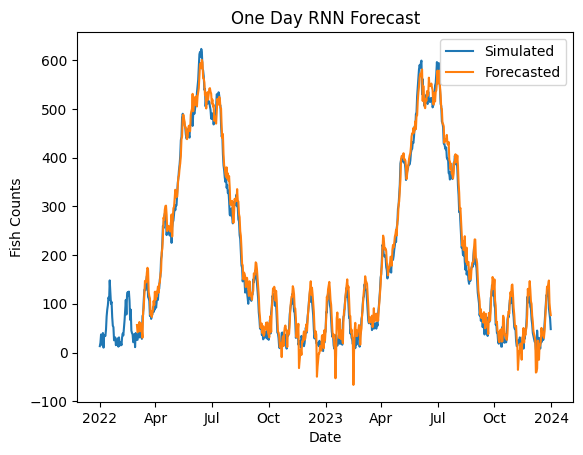

In [63]:
fc = forecast(rnnmodel, X, y, loss_func, device, 1)

fig,ax = plt.subplots(1,1)
ax.plot(day,truecounts,label="Simulated")
ax.plot(day[lb:],fc.cpu(),label="Forecasted")
ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(ax.xaxis.get_major_locator()))
plt.legend()
plt.xlabel("Date")
plt.ylabel("Fish Counts")
plt.title("One Day RNN Forecast")
plt.show()

In [64]:
# fc = forecast(tfmodel, X, y, loss_func, device, 1)

# fig,ax = plt.subplots(1,1)
# ax.plot(day,truecounts)
# ax.plot(day[lb:],fc.cpu())
# ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(ax.xaxis.get_major_locator()))
# plt.show()